In [1]:
import os

# Path to copied dataset
output_dir = r"D:\dataset4"

# Count files in each group
total_copied = 0
group_counts = {}

for group in ["MCI", "AD", "CN"]:
    group_path = os.path.join(output_dir, group)
    if os.path.exists(group_path):
        count = len([f for f in os.listdir(group_path) if f.endswith('.nii') or f.endswith('.nii.gz')])
        group_counts[group] = count
        total_copied += count

# Print results
print("📊 File count per group:")
for group, count in group_counts.items():
    print(f"  {group}: {count}")

print(f"\n✅ Total copied files: {total_copied}")
print(f"📌 Expected: 2294, Copied: {total_copied}")

# Check for mismatches
if total_copied == 2294:
    print("🎉 All files copied correctly!")
elif total_copied < 2294:
    print(f"❌ {2294 - total_copied} images are missing!")
elif total_copied > 2294:
    print(f"⚠️ {total_copied - 2294} extra images found!")


📊 File count per group:
  MCI: 1113
  AD: 476
  CN: 705

✅ Total copied files: 2294
📌 Expected: 2294, Copied: 2294
🎉 All files copied correctly!


In [2]:
import os
import shutil
from sklearn.model_selection import train_test_split

# Source directory containing subfolders 'AD', 'CN', 'MCI'
source_dir = r"D:\dataset4"
output_dir = r"D:\dataset4_split1"

classes = ['AD', 'CN', 'MCI']

# Create output directories
for split in ['train', 'val', 'test']:
    for cls in classes:
        os.makedirs(os.path.join(output_dir, split, cls), exist_ok=True)

# Process each class folder
for cls in classes:
    class_folder = os.path.join(source_dir, cls)
    nii_files = [f for f in os.listdir(class_folder) if f.endswith('.nii') or f.endswith('.nii.gz')]
    full_paths = [os.path.join(class_folder, f) for f in nii_files]

    # Stratified split using file names (assuming class labels are known from folder)
    train, temp = train_test_split(full_paths, test_size=0.2, random_state=42)
    val, test = train_test_split(temp, test_size=0.5, random_state=42)

    # Copy files to respective folders
    def copy_files(file_list, split):
        for f in file_list:
            dst = os.path.join(output_dir, split, cls, os.path.basename(f))
            shutil.copy(f, dst)

    copy_files(train, 'train')
    copy_files(val, 'val')
    copy_files(test, 'test')

print("Stratified splitting complete. NIfTI files organized into train/val/test.")


Stratified splitting complete. NIfTI files organized into train/val/test.


In [4]:
import os
from collections import defaultdict

base_dir = r"D:\dataset4_split1"
splits = ['train', 'val', 'test']
classes = ['AD', 'CN', 'MCI']

# Dictionary to store counts
counts = defaultdict(lambda: defaultdict(int))

for split in splits:
    for cls in classes:
        folder = os.path.join(base_dir, split, cls)
        if os.path.exists(folder):
            num_files = len([f for f in os.listdir(folder) if f.endswith('.nii') or f.endswith('.nii.gz')])
            counts[split][cls] = num_files

# Print results
total_per_class = {cls: 0 for cls in classes}
print("Split distribution:")
for cls in classes:
    total = sum(counts[split][cls] for split in splits)
    total_per_class[cls] = total
    print(f"\nClass: {cls} (Total: {total})")
    for split in splits:
        count = counts[split][cls]
        pct = (count / total * 100) if total > 0 else 0
        print(f"  {split}: {count} files ({pct:.2f}%)")


Split distribution:

Class: AD (Total: 476)
  train: 380 files (79.83%)
  val: 48 files (10.08%)
  test: 48 files (10.08%)

Class: CN (Total: 705)
  train: 564 files (80.00%)
  val: 70 files (9.93%)
  test: 71 files (10.07%)

Class: MCI (Total: 1113)
  train: 890 files (79.96%)
  val: 111 files (9.97%)
  test: 112 files (10.06%)


In [5]:
import os
import re
import pandas as pd

# Paths
csv_file = r"D:\ADNI1_Complete_1Yr_1.5T_12_20_2024.csv"  # CSV file path
dataset_dir = r"D:\dataset4_split1"  # Folder containing train/test/val

# Load CSV
df = pd.read_csv(csv_file)

# Ensure CSV contains necessary columns
if "Image Data ID" not in df.columns or "Group" not in df.columns:
    raise ValueError("CSV must contain 'Image Data ID' and 'Group' columns.")

# Create a mapping from Image Data ID to its Group (AD, CN, MCI)
image_label_mapping = {str(row["Image Data ID"]): row["Group"] for _, row in df.iterrows()}

# Regular expression to extract "Ixxxxx" from filenames
pattern = re.compile(r".*_I(\d+)\.nii(\.gz)?$")

# Process each split (train, test, val)
for split in ["train", "test", "val"]:
    split_path = os.path.join(dataset_dir, split)

    for category in os.listdir(split_path):  # Loop through AD, MCI, CN folders
        category_path = os.path.join(split_path, category)

        for filename in os.listdir(category_path):
            file_path = os.path.join(category_path, filename)

            # Extract Image Data ID (e.g., "I118678") from the filename
            match = pattern.match(filename)
            if match:
                image_id = f"I{match.group(1)}"  # Extracted Image Data ID (e.g., "I118678")
                ext = ".nii.gz" if filename.endswith(".nii.gz") else ".nii"

                # Check if the Image ID exists in the CSV mapping
                if image_id in image_label_mapping:
                    label = image_label_mapping[image_id]
                    new_filename = f"{image_id}_{label}{ext}"
                    new_path = os.path.join(category_path, new_filename)

                    # Rename the file
                    os.rename(file_path, new_path)
                    print(f"✅ Renamed: {filename} ➝ {new_filename}")
                else:
                    print(f"⚠️ Warning: Image ID {image_id} not found in CSV, skipping.")

print("✅ Image renaming complete!")


✅ Renamed: ADNI_002_S_0619_MR_MPR-R__GradWarp__N3__Scaled_Br_20070411125458928_S15145_I48617.nii ➝ I48617_AD.nii
✅ Renamed: ADNI_002_S_0619_MR_MPR-R__GradWarp__N3__Scaled_Br_20070816100717385_S33969_I67871.nii ➝ I67871_AD.nii
✅ Renamed: ADNI_002_S_0619_MR_MPR__GradWarp__N3__Scaled_Br_20070717184209073_S24022_I60451.nii ➝ I60451_AD.nii
✅ Renamed: ADNI_002_S_0816_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081002102135862_S18402_I118984.nii ➝ I118984_AD.nii
✅ Renamed: ADNI_002_S_0816_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070217005829488_S18402_I40731.nii ➝ I40731_AD.nii
✅ Renamed: ADNI_002_S_0816_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20070717185335251_S29612_I60465.nii ➝ I60465_AD.nii
✅ Renamed: ADNI_002_S_0816_MR_MPR__GradWarp__B1_Correction__N3__Scaled_Br_20080224131120787_S45030_I92146.nii ➝ I92146_AD.nii
✅ Renamed: ADNI_002_S_0938_MR_MPR__GradWarp__B1_Correction__N3__Scaled_2_Br_20081001115856421_S19852_I118685.nii ➝ I118685_AD.nii
✅ Renamed: ADNI_002_S_093

In [6]:
# Verify the dataset split and labels
import os
import re
import pandas as pd

# Paths
csv_file = r"D:\ADNI1_Complete_1Yr_1.5T_12_20_2024.csv"  # CSV file
dataset_dir = r"D:\dataset4_split1"  # Folder with train/test/val
log_file = r"D:\mismatch_log.txt1"  # File to store mismatches

# Load CSV and clean data
df = pd.read_csv(csv_file, dtype=str)
df["Image Data ID"] = df["Image Data ID"].str.strip()

# Create dictionary: {Ixxxxx: Label}
image_label_mapping = {f"I{row['Image Data ID'].lstrip('I')}": row["Group"].strip() for _, row in df.iterrows()}

# Regex to extract "Ixxxxx_Label" from filenames
pattern = re.compile(r"(I\d+)_(AD|MCI|CN)\.nii(\.gz)?$")

# Tracking mismatches
mismatches = []
correct_count = 0
total_count = 0

# Process each split (train, test, val)
for split in ["train", "test", "val"]:
    split_path = os.path.join(dataset_dir, split)

    for category in os.listdir(split_path):  # AD, MCI, CN
        category_path = os.path.join(split_path, category)

        for filename in os.listdir(category_path):
            total_count += 1
            file_path = os.path.join(category_path, filename)

            # Extract Image ID and Label from filename
            match = pattern.match(filename)
            if match:
                image_id, detected_label = match.group(1), match.group(2)

                # Check if Image ID exists in CSV mapping
                if image_id in image_label_mapping:
                    actual_label = image_label_mapping[image_id]

                    # Compare detected label with actual label
                    if detected_label == actual_label:
                        correct_count += 1
                    else:
                        mismatches.append(f"{filename} (Expected: {actual_label}, Found: {detected_label})")
                else:
                    mismatches.append(f"{filename} (ID not found in CSV)")

# Save mismatches to file
if mismatches:
    with open(log_file, "w") as f:
        for line in mismatches:
            f.write(line + "\n")
    print(f"⚠️ Mismatches found! Check {log_file}")

# Print summary
print(f"✅ Verification complete: {correct_count}/{total_count} files labeled correctly.")
if mismatches:
    print(f"⚠️ {len(mismatches)} mismatches detected. Review {log_file} for details.")
else:
    print("🎉 All images are labeled correctly!")


✅ Verification complete: 2294/2294 files labeled correctly.
🎉 All images are labeled correctly!


In [7]:
# finding extra files in the dataset
import os

expected_ids = set()  # Store expected IDs from the CSV

# Load expected Image IDs from CSV
import pandas as pd
csv_file = r"D:\ADNI1_Complete_1Yr_1.5T_12_20_2024.csv"
df = pd.read_csv(csv_file, dtype=str)
df["Image Data ID"] = df["Image Data ID"].str.strip()
expected_ids = {f"I{row['Image Data ID'].lstrip('I')}" for _, row in df.iterrows()}

# Check for extra files
extra_files = []

for split in ["train", "test", "val"]:
    split_path = os.path.join(dataset_dir, split)

    for category in os.listdir(split_path):
        category_path = os.path.join(split_path, category)

        for filename in os.listdir(category_path):
            if filename.endswith(".nii") or filename.endswith(".nii.gz"):
                image_id = filename.split("_")[0]  # Extract Ixxxxx
                
                if image_id not in expected_ids:
                    extra_files.append(os.path.join(category_path, filename))

# Print extra files
if extra_files:
    print(f"⚠️ Extra files found ({len(extra_files)}):")
    for file in extra_files:
        print(file)
else:
    print("✅ No extra files detected.")


✅ No extra files detected.


In [8]:
import os

dataset_dir = r"D:\dataset4_split1"

# List all files
all_files = []
for root, _, files in os.walk(dataset_dir):
    for file in files:
        if file.endswith(".nii") or file.endswith(".nii.gz"):
            all_files.append(os.path.join(root, file))

# Print results
print(f"🔢 Total files found: {len(all_files)}")
for file in all_files:
    print(file)  # Print full path to every image



🔢 Total files found: 2294
D:\dataset4_split1\test\AD\I118783_AD.nii
D:\dataset4_split1\test\AD\I119176_AD.nii
D:\dataset4_split1\test\AD\I119290_AD.nii
D:\dataset4_split1\test\AD\I119306_AD.nii
D:\dataset4_split1\test\AD\I31161_AD.nii
D:\dataset4_split1\test\AD\I37007_AD.nii
D:\dataset4_split1\test\AD\I38918_AD.nii
D:\dataset4_split1\test\AD\I39817_AD.nii
D:\dataset4_split1\test\AD\I40312_AD.nii
D:\dataset4_split1\test\AD\I40980_AD.nii
D:\dataset4_split1\test\AD\I43071_AD.nii
D:\dataset4_split1\test\AD\I50426_AD.nii
D:\dataset4_split1\test\AD\I51542_AD.nii
D:\dataset4_split1\test\AD\I54780_AD.nii
D:\dataset4_split1\test\AD\I60741_AD.nii
D:\dataset4_split1\test\AD\I63036_AD.nii
D:\dataset4_split1\test\AD\I63176_AD.nii
D:\dataset4_split1\test\AD\I63349_AD.nii
D:\dataset4_split1\test\AD\I63442_AD.nii
D:\dataset4_split1\test\AD\I63619_AD.nii
D:\dataset4_split1\test\AD\I63757_AD.nii
D:\dataset4_split1\test\AD\I64898_AD.nii
D:\dataset4_split1\test\AD\I65013_AD.nii
D:\dataset4_split1\test\AD\

In [ ]:
# now the dataset is ready for training

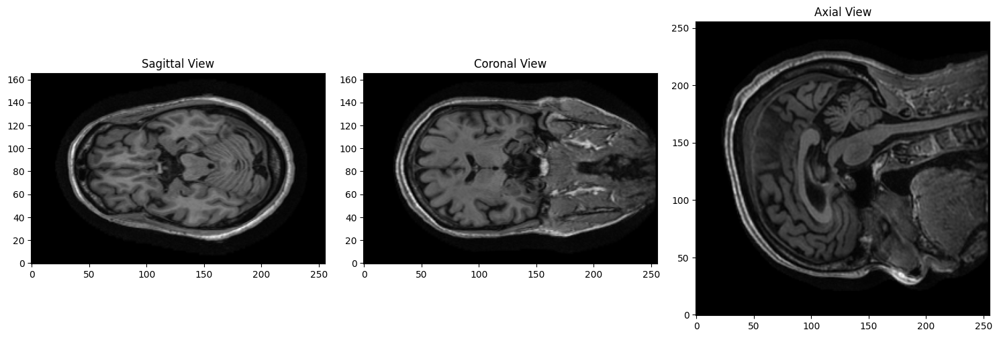

In [2]:
import nibabel as nib
import matplotlib.pyplot as plt

# Path to your NIFTI scan
nii_path = r"D:\dataset4_split1\train\AD\I101549_AD.nii"  # Replace with your actual file path

# Load the scan
img = nib.load(nii_path)
data = img.get_fdata()

# Get center indices for each axis
sagittal = data.shape[0] // 2
coronal = data.shape[1] // 2
axial = data.shape[2] // 2

# Plot central slices from 3 planes
plt.figure(figsize=(15, 5))

# Sagittal view
plt.subplot(1, 3, 1)
plt.imshow(data[sagittal, :, :].T, cmap='gray', origin='lower')
plt.title("Sagittal View")

# Coronal view
plt.subplot(1, 3, 2)
plt.imshow(data[:, coronal, :].T, cmap='gray', origin='lower')
plt.title("Coronal View")

# Axial view
plt.subplot(1, 3, 3)
plt.imshow(data[:, :, axial].T, cmap='gray', origin='lower')
plt.title("Axial View")

plt.tight_layout()
plt.show()


In [7]:
import nibabel as nib

# Path to your NIfTI file
nii_path = r"D:\dataset4_split1\train\AD\I101549_AD.nii"  # Replace with your actual file path

# Load the NIfTI file
img = nib.load(nii_path)
data = img.get_fdata()

# Get the total number of slices in each plane
sagittal_slices = data.shape[0]  # Number of slices along the sagittal plane
coronal_slices = data.shape[1]   # Number of slices along the coronal plane
axial_slices = data.shape[2]     # Number of slices along the axial plane

# Print the results
print(f"Total slices in Sagittal plane: {sagittal_slices}")
print(f"Total slices in Coronal plane: {coronal_slices}")
print(f"Total slices in Axial plane: {axial_slices}")

Total slices in Sagittal plane: 256
Total slices in Coronal plane: 256
Total slices in Axial plane: 166


In [ ]:
# as our ROI is Hippocampus so we need middle slices so the range which we will use is 
#sagittal_range = (85, 170)
#coronal_range = (85, 170)
#axial_range = (55, 110)

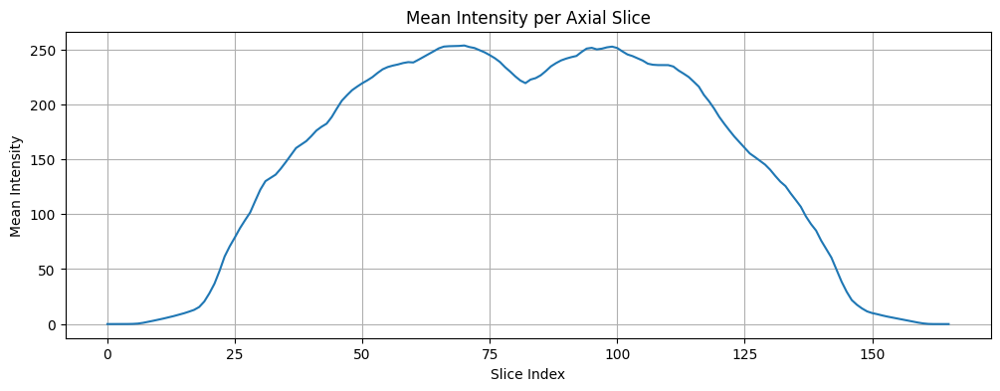

In [3]:
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

# Load the scan
nii_path = r"D:\dataset4_split1\train\AD\I101549_AD.nii"  # Update as needed
img = nib.load(nii_path)
data = img.get_fdata()

# Compute mean intensity for each axial slice
slice_means = [np.mean(data[:, :, i]) for i in range(data.shape[2])]

# Plot the mean intensities
plt.figure(figsize=(12, 4))
plt.plot(slice_means)
plt.title('Mean Intensity per Axial Slice')
plt.xlabel('Slice Index')
plt.ylabel('Mean Intensity')
plt.grid(True)
plt.show()


Image shape: (192, 192, 160)


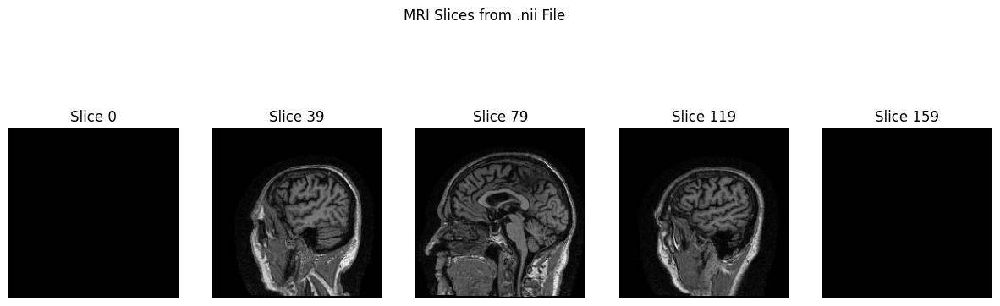

In [4]:
#to load and visualize the mri images
import nibabel as nib
import matplotlib.pyplot as plt
import numpy as np
import os

base_dir = r"D:\dataset4_split1"
file_name = "I31143_AD.nii"
full_path = os.path.join(base_dir, "train", "AD", file_name)
img = nib.load(full_path)
img_data = img.get_fdata()  # Convert to NumPy array
# Display shape
print("Image shape:", img_data.shape)

# Plot some middle slices along the 3rd axis (axial view)
plt.figure(figsize=(15, 5))
for i, slice_index in enumerate(np.linspace(0, img_data.shape[2]-1, 5, dtype=int)):
    plt.subplot(1, 5, i+1)
    plt.imshow(img_data[:, :, slice_index], cmap="gray")
    plt.title(f"Slice {slice_index}")
    plt.axis('off')

plt.suptitle("MRI Slices from .nii File")
plt.show()


Image shape: (192, 192, 160)


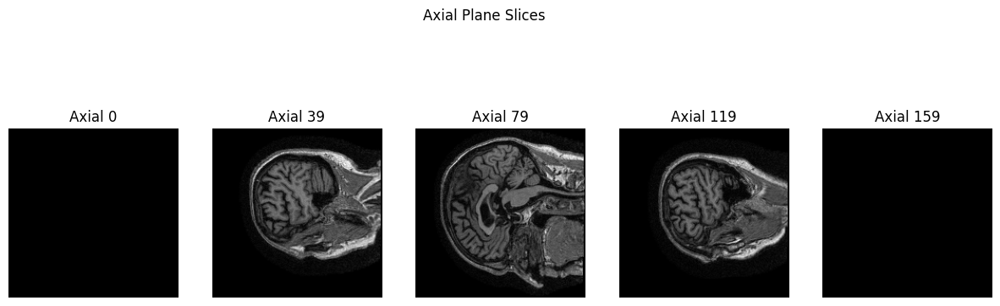

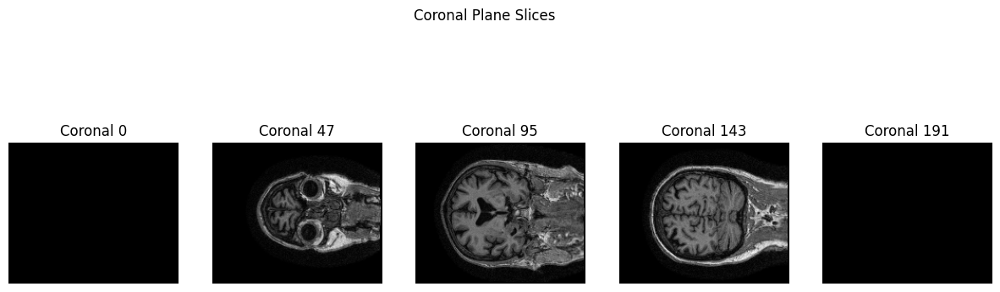

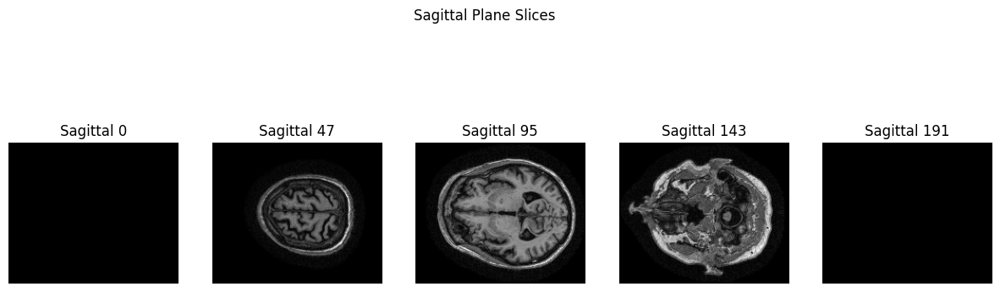

In [6]:
import nibabel as nib
import matplotlib.pyplot as plt
import numpy as np
import os

# Load .nii MRI file
file_path = r"D:\dataset4_split1\train\AD\I31143_AD.nii"
img = nib.load(file_path)
data = img.get_fdata()
print("Image shape:", data.shape)

# Utility to visualize a range of slices in a plane
def plot_plane_slices(data, axis=2, num_slices=5, title='Axial'):
    plt.figure(figsize=(15, 5))
    indices = np.linspace(0, data.shape[axis] - 1, num_slices, dtype=int)
    for i, idx in enumerate(indices):
        plt.subplot(1, num_slices, i+1)
        if axis == 0:
            slice_img = data[idx, :, :]
        elif axis == 1:
            slice_img = data[:, idx, :]
        else:  # axial
            slice_img = data[:, :, idx]
        plt.imshow(np.rot90(slice_img), cmap='gray')
        plt.title(f"{title} {idx}")
        plt.axis('off')
    plt.suptitle(f"{title} Plane Slices")
    plt.show()

# Axial (Z-axis)
plot_plane_slices(data, axis=2, title='Axial')

# Coronal (Y-axis)
plot_plane_slices(data, axis=1, title='Coronal')

# Sagittal (X-axis)
plot_plane_slices(data, axis=0, title='Sagittal')


In [9]:
import nibabel as nib
import numpy as np
import cv2
import os

def extract_useful_slices(nii_path, output_dir, label, id_, sagittal_range=(85, 170), coronal_range=(85, 170), axial_range=(55, 110)):
    img = nib.load(nii_path).get_fdata()
    img = np.rot90(img)  # Optional: for proper orientation

    # Create subdirectories for each plane
    sagittal_dir = os.path.join(output_dir, "sagittal")
    coronal_dir = os.path.join(output_dir, "coronal")
    axial_dir = os.path.join(output_dir, "axial")
    os.makedirs(sagittal_dir, exist_ok=True)
    os.makedirs(coronal_dir, exist_ok=True)
    os.makedirs(axial_dir, exist_ok=True)

    # Extract sagittal slices
    for i in range(sagittal_range[0], sagittal_range[1]):
        slice_img = img[i, :, :]
        slice_img = cv2.normalize(slice_img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
        slice_img = cv2.resize(slice_img, (176, 176))
        slice_filename = f"{id_}_{label}_sagittal_{i}.png"
        cv2.imwrite(os.path.join(sagittal_dir, slice_filename), slice_img)

    # Extract coronal slices
    for i in range(coronal_range[0], coronal_range[1]):
        slice_img = img[:, i, :]
        slice_img = cv2.normalize(slice_img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
        slice_img = cv2.resize(slice_img, (176, 176))
        slice_filename = f"{id_}_{label}_coronal_{i}.png"
        cv2.imwrite(os.path.join(coronal_dir, slice_filename), slice_img)

    # Extract axial slices
    for i in range(axial_range[0], axial_range[1]):
        slice_img = img[:, :, i]
        slice_img = cv2.normalize(slice_img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
        slice_img = cv2.resize(slice_img, (176, 176))
        slice_filename = f"{id_}_{label}_axial_{i}.png"
        cv2.imwrite(os.path.join(axial_dir, slice_filename), slice_img)

def process_images_in_directory(dataset_dir, output_base_dir, sagittal_range=(85, 170), coronal_range=(85, 170), axial_range=(55, 110)):
    for split in ["train", "test", "val"]:
        split_path = os.path.join(dataset_dir, split)

        for category in os.listdir(split_path):
            category_path = os.path.join(split_path, category)

            for filename in os.listdir(category_path):
                if filename.endswith(('.nii', '.nii.gz')):  # Process only .nii files
                    nii_path = os.path.join(category_path, filename)
                    label = category  # Assuming the folder name represents the label
                    id_ = filename.split('_')[0]  # Extract the ID (assuming ID is the first part)
                    output_dir = os.path.join(output_base_dir, split, category)

                    extract_useful_slices(nii_path, output_dir, label, id_, sagittal_range, coronal_range, axial_range)

# Define paths
dataset_dir = r"D:\dataset4_split1"
output_base_dir = r"D:\processed_slices"

# Define slice ranges
sagittal_range = (85, 170)
coronal_range = (85, 170)
axial_range = (55, 110)

# Process all images
process_images_in_directory(dataset_dir, output_base_dir, sagittal_range, coronal_range, axial_range)

In [12]:
import os
import hashlib
from collections import defaultdict

def calculate_file_hash(file_path):
    """Calculate the MD5 hash of a file."""
    hash_md5 = hashlib.md5()
    with open(file_path, "rb") as f:
        for chunk in iter(lambda: f.read(4096), b""):
            hash_md5.update(chunk)
    return hash_md5.hexdigest()

def verify_slices_for_duplicates(base_dir):
    """Verify that there are no duplicate slices in the dataset."""
    hash_map = defaultdict(list)  # Map to store hashes and corresponding file paths
    duplicate_files = []  # List to store duplicate file paths

    # Walk through all files in the base directory
    for root, _, files in os.walk(base_dir):
        for file in files:
            if file.endswith(".png"):  # Check only PNG files
                file_path = os.path.join(root, file)
                file_hash = calculate_file_hash(file_path)

                # Check for duplicates
                if file_hash in hash_map:
                    duplicate_files.append((file_path, hash_map[file_hash][0]))  # Store duplicate and original
                else:
                    hash_map[file_hash].append(file_path)

    # Report results
    if duplicate_files:
        print(f"⚠️ Found {len(duplicate_files)} duplicate slices:")
        for dup, original in duplicate_files:
            print(f"Duplicate: {dup} | Original: {original}")
    else:
        print("✅ No duplicate slices found!")

# Define the path to the processed slices directory
processed_slices_dir = r"D:\processed_slices"

# Verify for duplicates
verify_slices_for_duplicates(processed_slices_dir)

✅ No duplicate slices found!


In [11]:
import os
import hashlib
from collections import defaultdict

def calculate_file_hash(file_path):
    """Calculate the MD5 hash of a file."""
    hash_md5 = hashlib.md5()
    with open(file_path, "rb") as f:
        for chunk in iter(lambda: f.read(4096), b""):
            hash_md5.update(chunk)
    return hash_md5.hexdigest()

def remove_duplicate_slices(base_dir):
    """Remove duplicate slices in the dataset."""
    hash_map = defaultdict(list)  # Map to store hashes and corresponding file paths
    duplicate_files = []  # List to store duplicate file paths

    # Walk through all files in the base directory
    for root, _, files in os.walk(base_dir):
        for file in files:
            if file.endswith(".png"):  # Check only PNG files
                file_path = os.path.join(root, file)
                file_hash = calculate_file_hash(file_path)

                # Check for duplicates
                if file_hash in hash_map:
                    duplicate_files.append(file_path)  # Mark as duplicate
                else:
                    hash_map[file_hash].append(file_path)

    # Remove duplicates
    for dup in duplicate_files:
        os.remove(dup)
        print(f"🗑️ Removed duplicate slice: {dup}")

    print(f"\n✅ Removed {len(duplicate_files)} duplicate slices.")

# Define the path to the processed slices directory
processed_slices_dir = r"D:\processed_slices"

# Remove duplicates
remove_duplicate_slices(processed_slices_dir)

🗑️ Removed duplicate slice: D:\processed_slices\test\CN\axial\I31008_CN_axial_100.png
🗑️ Removed duplicate slice: D:\processed_slices\test\CN\axial\I31008_CN_axial_101.png
🗑️ Removed duplicate slice: D:\processed_slices\test\CN\axial\I31008_CN_axial_102.png
🗑️ Removed duplicate slice: D:\processed_slices\test\CN\axial\I31008_CN_axial_103.png
🗑️ Removed duplicate slice: D:\processed_slices\test\CN\axial\I31008_CN_axial_104.png
🗑️ Removed duplicate slice: D:\processed_slices\test\CN\axial\I31008_CN_axial_105.png
🗑️ Removed duplicate slice: D:\processed_slices\test\CN\axial\I31008_CN_axial_106.png
🗑️ Removed duplicate slice: D:\processed_slices\test\CN\axial\I31008_CN_axial_107.png
🗑️ Removed duplicate slice: D:\processed_slices\test\CN\axial\I31008_CN_axial_108.png
🗑️ Removed duplicate slice: D:\processed_slices\test\CN\axial\I31008_CN_axial_109.png
🗑️ Removed duplicate slice: D:\processed_slices\test\CN\axial\I31008_CN_axial_55.png
🗑️ Removed duplicate slice: D:\processed_slices\test\CN